In [52]:
import numpy as np
import cv2
import glob
import open3d as o3d
import matplotlib.pyplot as plt
import os
from tqdm import tqdm
import copy

from process_bag import get_images
from utils import get_o3d_intrinsics, colordepth_to_rgbd, rgbd_to_pcd, remove_outliers

depth_intrinsics, color_intrinsics = get_o3d_intrinsics()

In [ ]:
# i = 43
# gray = cv2.cvtColor(color_imgs[i], cv2.COLOR_RGB2GRAY)
# depth_img = depth_imgs[i]
# # Find 0.3 percentile depth
# depth_thresh = np.percentile(depth_img, 40)
# print(depth_thresh)

# # msk = 
# msk = cv2.bitwise_and(
#     (depth_img < depth_thresh).astype(np.uint8),
#     (depth_img > 0).astype(np.uint8)
# )
# # plt.imshow(depth_img)
# filt_img = cv2.bitwise_and(gray, gray, mask=msk.astype(np.uint8))
# plt.imshow(filt_img)

# img = color_imgs[43].copy()

# gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
# ret, corners = cv2.findChessboardCornersSB(
#     gray, cb_counts, flags=cv2.CALIB_CB_EXHAUSTIVE + cv2.CALIB_CB_NORMALIZE_IMAGE)
# corners = finetune_corners(gray, corners)
# img = cv2.drawChessboardCorners(img, cb_counts, corners, ret)
# plt.imshow(img)

# img = color_imgs[43].copy()

# lwr = np.array([0, 0, 0])
# upr = np.array([180, 255, 10])
# # lwr = np.array([0, 0, 70])
# # upr = np.array([180, 255, 255])
# hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
# msk = cv2.inRange(hsv, lwr, upr)

# # Detect corners on mask
# ret, corners = cv2.findChessboardCornersSB(
#     msk, cb_counts, flags=cv2.CALIB_CB_EXHAUSTIVE + cv2.CALIB_CB_NORMALIZE_IMAGE)
# # corners = finetune_corners(msk, corners)
# img = cv2.drawChessboardCorners(img, cb_counts, corners, ret)
# plt.imshow(msk)
# plt.show()
# # plt.imshow(img)

In [53]:
# Chessboard size
cb_counts = (8, 6)
cb_size = 0.03

# Rendering settings
cb_scale = 0.03
voxel_size = 0.02
camera_size = 2 * cb_scale
origin_size = 4 * cb_scale

kwargs = dict(
    zoom=0.5,
    front=[0.0, 0.0, -1.0],
    lookat=[0.0, 0.0, 0.0],
    up=[1.0, 0, 0],
)


### Pose Estimation

In [3]:
# Load/Process Data
color_fp = "data/guitar_2/color.npy"
depth_fp = "data/guitar_2/depth.npy"
# color_fp = "data/guitar_2/color_single.npy"
# depth_fp = "data/guitar_2/depth_single.npy"
if os.path.exists(color_fp) and os.path.exists(depth_fp):
    color_imgs = np.load(color_fp)
    depth_imgs = np.load(depth_fp)
else:
    color_imgs = []
    depth_imgs = []
    fps = sorted(glob.glob('data/guitar_2/bags/*.bag'))
    for i, fp in enumerate(fps):
        print(f"Processing bag {i+1}/{len(fps)} {fp}")
        color_img, depth_img = get_images(
            start_idx=30,
            end_idx=1000,
            bag_fp=fp,
            align=True,
            median=True
        )
        color_imgs.append(color_img)
        depth_imgs.append(depth_img)
    
    color_imgs = np.stack(color_imgs)
    depth_imgs = np.stack(depth_imgs)
    np.save(color_fp, color_imgs)
    np.save(depth_fp, depth_imgs)
color_imgs.shape, depth_imgs.shape   

((25, 480, 640, 3), (25, 480, 640))

In [4]:
# termination criteria
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.01)

# Define object points
objp = np.zeros((cb_counts[0]*cb_counts[1],3), np.float32)
objp[:,:2] = np.mgrid[0:cb_counts[0],0:cb_counts[1]].T.reshape(-1,2)
objp *= cb_size

In [5]:
def finetune_corners(gray, corners):
    size = 5
    corners2 = cv2.cornerSubPix(gray,corners,(size, size),(-1,-1),criteria)
    # Arrange corner order
    if corners2[0, 0, 0] > corners2[-1, 0, 0]:
        corners2 = corners2[::-1]
    return corners2

In [6]:
objpoints = [] # 3d point in real world space
imgpoints = [] # 2d points in image plane.
used_idxs = [] # Indices of images used

for i, img in enumerate(color_imgs):
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)

    # Find and refine corners
    ret, corners = cv2.findChessboardCornersSB(
        gray, cb_counts, flags=cv2.CALIB_CB_EXHAUSTIVE)
    if ret == True:
        used_idxs.append(i)
        objpoints.append(objp)
        imgpoints.append(
            finetune_corners(gray, corners)
        )

In [8]:
color_imgs = color_imgs[used_idxs]
depth_imgs = depth_imgs[used_idxs]

n = len(used_idxs)
print(f"Found {n} images with checkerboard corners")

Found 25 images with checkerboard corners


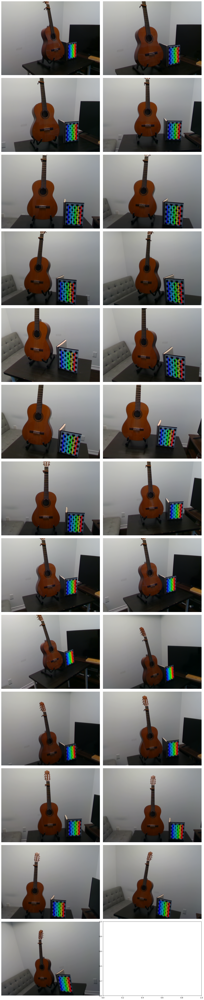

In [9]:
# Plot corners
width = 2
f = lambda x: (x + width - 1) // width
fig, axs = plt.subplots(f(n), width, figsize=(16, 6*f(n)))
for i, ax in enumerate(axs.flatten()):
    try:
        img_tmp = color_imgs[i].copy()
        corners2 = imgpoints[i]
        img_tmp = cv2.drawChessboardCorners(img_tmp, cb_counts, corners2, True)
        ax.imshow(img_tmp)
        ax.axis("off")
    except:
        continue
plt.tight_layout()
plt.show()

In [ ]:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(
    objpoints, imgpoints, gray.shape[::-1], None, None)
h, w, _ = color_imgs[0].shape

estimated_intrinsics = o3d.camera.PinholeCameraIntrinsic()
estimated_intrinsics.intrinsic_matrix = mtx

print(color_intrinsics.intrinsic_matrix)
print()
print(estimated_intrinsics.intrinsic_matrix)
dist

In [ ]:
def draw(img, corners, imgpts):
    corner = tuple(corners[0].ravel())
    corner = (int(corner[0]), int(corner[1]))
    imgpts = np.int32(imgpts).reshape(-1,2)

    img = cv2.line(img, corner, tuple(imgpts[0].ravel()), (255,0,0), 5)
    img = cv2.line(img, corner, tuple(imgpts[1].ravel()), (0,255,0), 5)
    img = cv2.line(img, corner, tuple(imgpts[2].ravel()), (0,0,255), 5)
    return img

In [ ]:
# Note the negative z axis
axis = np.float32([[1,0,0], [0,1,0], [0,0,-1]]).reshape(-1,3) * cb_size * 5

rvecs_lst = []
tvecs_lst = []

fig, axs = plt.subplots(f(n), width, figsize=(16, 6*f(n)))
for i, ax in enumerate(axs.flatten()):
    try:
        img_tmp = color_imgs[i].copy()
        corners2 = imgpoints[i]

        # Find the rotation and translation vectors.
        retval, rvecs, tvecs, inliers = cv2.solvePnPRansac(
            objp, 
            corners2, 
            mtx, 
            dist,
            iterationsCount=1000,
            reprojectionError=0.5
        )

        # project 3D points to image plane
        imgpts, jac = cv2.projectPoints(axis, rvecs, tvecs, mtx, dist)

        img_tmp = draw(img_tmp, corners2, imgpts)
        ax.imshow(img_tmp)
        ax.axis("off")

        rvecs_lst.append(rvecs)
        tvecs_lst.append(tvecs)
    except:
        continue
plt.tight_layout()
plt.show()

In [ ]:
# Turn lists into extrinsic parameters
rvecs = np.array(rvecs_lst)
tvecs = np.array(tvecs_lst)

# Turn into 4x4 extrinsic matrices
w2c_exts = np.zeros((len(rvecs), 4, 4))
c2w_exts = np.zeros((len(rvecs), 4, 4))
for i in range(len(rvecs)):
    R, _ = cv2.Rodrigues(rvecs[i])
    w2c_exts[i, :3, :3] = R
    w2c_exts[i, :3, 3] = tvecs[i].T
    w2c_exts[i, 3, 3] = 1

    # world to camera -> camera to world
    c2w_exts[i] = np.linalg.inv(w2c_exts[i])

In [ ]:
origin = o3d.geometry.TriangleMesh.create_coordinate_frame(
    size=origin_size, origin=[0,0,0])

# Draw camera locations and rotations
cameras = []
pcds_align = []
pcds_full = []

intrinsics = color_intrinsics
# intrinsics = estimated_intrinsics
for c2w_ext, color_img, depth_img in zip(c2w_exts, color_imgs, depth_imgs):
    # Get the RGBD image
    rgbd_img = colordepth_to_rgbd(color_img, depth_img)
    
    # Create a camera frame
    camera = o3d.geometry.TriangleMesh.create_coordinate_frame(
        size=camera_size, origin=[0,0,0])
    camera.transform(c2w_ext)

    # Create a pointcloud
    pcd = rgbd_to_pcd(rgbd_img, intrinsics)
    pcds_full.append(pcd)

    # Downsample and Align
    pcd = pcd.voxel_down_sample(voxel_size=voxel_size)
    pcd.transform(c2w_ext)
    
    # Add to lists
    cameras.append(camera)
    pcds_align.append(pcd)

In [ ]:
o3d.visualization.draw_geometries(
    pcds_align + [origin] + cameras, 
    **kwargs
)
# o3d.visualization.draw_geometries(
#     pcds_full + [origin] + cameras, 
#     **kwargs
# )

In [ ]:
# Save the pointclouds and extrinsics
folder_fp = "data/guitar_2"
for i, (pcd, c2w_ext) in enumerate(zip(pcds_full, c2w_exts)):
    fp = f"{folder_fp}/plys/pcd_{i:03}.ply"
    o3d.io.write_point_cloud(fp, pcd)

np.save(f"{folder_fp}/c2w_extrinsics.npy", c2w_exts)

### Denoise Pointclouds

In [13]:
# Load the pointclouds and extrinsics
folder_fp = "data/guitar_2"
pcds_full = []
for fp in sorted(glob.glob(f"{folder_fp}/plys/pcd_*.ply")):
    pcds_full.append(o3d.io.read_point_cloud(fp))

c2w_exts = np.load(f"{folder_fp}/c2w_extrinsics.npy")

In [14]:
# Seed and split into train, val, test
np.random.seed(0)
n = len(pcds_full)
idxs = np.arange(n)
np.random.shuffle(idxs)

train_percent, val_percent, test_percent = 0.6, 0.2, 0.2
train_idxs = idxs[:int(n*train_percent)]
val_idxs = idxs[int(n*train_percent):int(n*(train_percent+val_percent))]
test_idxs = idxs[int(n*(train_percent+val_percent)):]

pcds_train = [pcds_full[i] for i in train_idxs]
pcds_val = [pcds_full[i] for i in val_idxs]
pcds_test = [pcds_full[i] for i in test_idxs]

c2w_exts_train = c2w_exts[train_idxs]
c2w_exts_val = c2w_exts[val_idxs]
c2w_exts_test = c2w_exts[test_idxs]

print(train_idxs)
len(pcds_train), len(pcds_val), len(pcds_test)

[ 5  2 19 16 11 22 17 24 23 14  1 10 13  8  6]


(15, 5, 5)

In [15]:
def o3d_vis(pcds, c2w_exts, align=True, use_kwargs=True):
    # Test Alignment
    pcds_align = []
    cameras = []
    for i in range(len(pcds)):
        pcd = copy.deepcopy(pcds[i])
        c2w_ext = c2w_exts[i]

        if align:
            pcd.transform(c2w_ext)
        pcd = pcd.voxel_down_sample(voxel_size=voxel_size)
        pcds_align.append(pcd)

        # Camera frame
        camera = o3d.geometry.TriangleMesh.create_coordinate_frame(
            size=camera_size, origin=[0,0,0])
        camera.transform(c2w_ext)
        cameras.append(camera)

    # Make origin a 3d box
    # origin = o3d.geometry.TriangleMesh.create_box(
    #     width=origin_size, height=origin_size, depth=origin_size)
    # origin.paint_uniform_color([0.9, 0.1, 0.1])
    # origin.translate([0,0,-origin_size/2])

    # origin coords
    origin = o3d.geometry.TriangleMesh.create_coordinate_frame(
        size=origin_size, origin=[0,0,0])

    if use_kwargs:
        o3d.visualization.draw_geometries(pcds_align + cameras + [origin], 
        **kwargs)
    else:
        o3d.visualization.draw_geometries(pcds_align + cameras + [origin])

In [16]:
o3d_vis(pcds_train, c2w_exts_train)
# o3d_vis(pcds_val, c2w_exts_val)
# o3d_vis(pcds_test, c2w_exts_test)

In [17]:
nb_neighbors = 20
std_ratio = 0.3
nb_points = 60
radius = 0.025

voxel_size = 0.005
# voxel_size = None

def clean_pcds(pcds_full, c2w_exts, voxel_size=None):
    pcds_clean = []
    for i in tqdm(range(len(pcds_full))):
        clean = pcds_full[i]
        if voxel_size is not None:
            clean = clean.voxel_down_sample(voxel_size=voxel_size)
        
        clean = remove_outliers(
            clean,
            nb_neighbors=nb_neighbors,
            std_ratio=std_ratio,
            nb_points=nb_points,
            radius=radius
        )
        # clean.transform(c2w_exts[i])
        pcds_clean.append(clean)
        
    return pcds_clean

pcds_clean_train = clean_pcds(pcds_train, c2w_exts_train, voxel_size=voxel_size)
pcds_clean_val = clean_pcds(pcds_val, c2w_exts_val, voxel_size=voxel_size)
pcds_clean_test = clean_pcds(pcds_test, c2w_exts_test, voxel_size=voxel_size)

100%|██████████| 5/5 [00:01<00:00,  3.18it/s]


In [20]:
o3d_vis(pcds_clean_train, c2w_exts_train, align=True)

### Align Pointclouds

In [21]:
# Estimate the normals
for pcds, c2w_exts in zip(
        [pcds_clean_train, pcds_clean_val, pcds_clean_test],
        [c2w_exts_train, c2w_exts_val, c2w_exts_test]
    ):
    for i in range(len(pcds)):
        pcd = pcds[i]
        pcd.transform(c2w_exts[i])
        pcd.estimate_normals(
            search_param=o3d.geometry.KDTreeSearchParamHybrid(
                radius=0.1, max_nn=30))

In [22]:
o3d_vis(pcds_clean_train, c2w_exts_train, align=False)

In [12]:
# Define crop bounds
# end_1 = np.array([0.04, -0.62, -0.55])
# end_2 = np.array([1.3, -0.16, 0.35])
end_1 = np.array([0.04, -0.62, -0.55])
end_2 = np.array([1.3, 0.5, 0.35])

coord_1 = o3d.geometry.TriangleMesh.create_coordinate_frame(
    size=0.5, origin=[0,0,0])
coord_2 = o3d.geometry.TriangleMesh.create_coordinate_frame(
    size=0.5, origin=[0,0,0])
coord_1.translate(end_1)
coord_2.translate(end_2)

bbox = o3d.geometry.AxisAlignedBoundingBox(min_bound=end_1, max_bound=end_2)

pcds_crops = [[], [], []]
for i, pcds_clean in enumerate([pcds_clean_train, pcds_clean_val, pcds_clean_test]):
    for pcd in pcds_clean:
        pcd_tmp = copy.deepcopy(pcd)
        pcds_crops[i].append(pcd.crop(bbox))

o3d.visualization.draw_geometries(pcds_crops[0] + [coord_1, coord_2], **kwargs)

In [13]:
# Fuse the point clouds and draw bounding box
pcd_fused = o3d.geometry.PointCloud()
for pcd in pcds_crops[0]:
    pcd_fused += pcd

pcd_fused = pcd_fused.voxel_down_sample(voxel_size=voxel_size)
bbox = pcd_fused.get_axis_aligned_bounding_box()
bbox.color = (1, 0, 0)
o3d.visualization.draw_geometries([pcd_fused, bbox], **kwargs)

In [14]:
np.round(pcd_fused.get_min_bound(), 3), np.round(pcd_fused.get_max_bound(), 3)

(array([ 0.04 , -0.577, -0.143]), array([1.02 , 0.163, 0.223]))

In [59]:
o3d.visualization.draw_geometries(pcds_clean_train + [coord_1, coord_2], **kwargs)

In [ ]:
# Filter out points that are too bright or too gray
color_thresh = 0.5
gray_thresh = 0.07

pcds_filt = []
for i in range(len(pcds_crop)):
    pcd = pcds_crop[i]
    colors = np.asarray(pcd.colors)
    
    color_idxs = np.where(np.mean(colors, axis=1) > color_thresh)[0]
    gray_idxs = np.where(np.max(colors, axis=1) - np.min(colors, axis=1) < gray_thresh)[0]
    idxs = np.union1d(color_idxs, gray_idxs)
    print(len(idxs))
    pcd_filt = pcd.select_by_index(
        idxs,
        invert=True
    )
    pcds_filt.append(pcd_filt)


In [ ]:
o3d.visualization.draw_geometries(pcds_filt + [coord_1, coord_2], **kwargs)

In [53]:
pcds_crops[0]

[PointCloud with 0 points.,
 PointCloud with 0 points.,
 PointCloud with 0 points.,
 PointCloud with 0 points.,
 PointCloud with 0 points.,
 PointCloud with 0 points.,
 PointCloud with 0 points.,
 PointCloud with 0 points.,
 PointCloud with 0 points.,
 PointCloud with 0 points.,
 PointCloud with 0 points.,
 PointCloud with 0 points.,
 PointCloud with 0 points.,
 PointCloud with 0 points.,
 PointCloud with 0 points.]

### Multiway Registration

In [ ]:
# From http://www.open3d.org/docs/latest/tutorial/Advanced/multiway_registration.html
def pairwise_registration(
        source, target, max_correspondence_distance_coarse,
        max_correspondence_distance_fine
    ):
    # print("Apply point-to-plane ICP")
    # Coarse ICP starting with identity matrix
    icp_coarse = o3d.pipelines.registration.registration_icp(
        source, 
        target, 
        max_correspondence_distance_coarse, 
        init = np.identity(4),
        estimation_method = o3d.pipelines.registration.TransformationEstimationPointToPlane()
    )
    # Fine ICP using the result of coarse ICP as initialization
    icp_fine = o3d.pipelines.registration.registration_icp(
        source, 
        target, 
        max_correspondence_distance_fine,
        init = icp_coarse.transformation,
        estimation_method = o3d.pipelines.registration.TransformationEstimationPointToPlane()
    )
    
    # Return the transformation matrix and information matrix
    transformation_icp = icp_fine.transformation
    information_icp = o3d.pipelines.registration.get_information_matrix_from_point_clouds(
        source, target, max_correspondence_distance_fine,
        icp_fine.transformation)
    return transformation_icp, information_icp


def full_registration(
        pcds, max_correspondence_distance_coarse,
        max_correspondence_distance_fine
    ):
    pose_graph = o3d.pipelines.registration.PoseGraph()
    odometry = np.identity(4)
    pose_graph.nodes.append(o3d.pipelines.registration.PoseGraphNode(odometry))
    n_pcds = len(pcds)
    for source_id in tqdm(range(n_pcds)):
        for target_id in range(source_id + 1, n_pcds):
            transformation_icp, information_icp = pairwise_registration(
                pcds[source_id], 
                pcds[target_id], 
                max_correspondence_distance_coarse,
                max_correspondence_distance_fine,
            )
            # print("Build o3d.pipelines.registration.PoseGraph")
            if target_id == source_id + 1:  # odometry case
                odometry = np.dot(transformation_icp, odometry)
                pose_graph.nodes.append(
                    o3d.pipelines.registration.PoseGraphNode(
                        np.linalg.inv(odometry)))
                pose_graph.edges.append(
                    o3d.pipelines.registration.PoseGraphEdge(source_id,
                                                             target_id,
                                                             transformation_icp,
                                                             information_icp,
                                                             uncertain=False))
            else:  # loop closure case
                pose_graph.edges.append(
                    o3d.pipelines.registration.PoseGraphEdge(source_id,
                                                             target_id,
                                                             transformation_icp,
                                                             information_icp,
                                                             uncertain=True))
    return pose_graph

In [ ]:
# Align using cropped point clouds
max_correspondence_distance_coarse = voxel_size * 4
max_correspondence_distance_fine = voxel_size * 2
# with o3d.utility.VerbosityContextManager(o3d.utility.VerbosityLevel.Debug) as cm:
with o3d.utility.VerbosityContextManager(o3d.utility.VerbosityLevel.Error) as cm:
    pose_graph = full_registration(pcds_filt,
                                   max_correspondence_distance_coarse,
                                   max_correspondence_distance_fine)

In [ ]:
print("Optimizing PoseGraph ...")
option = o3d.pipelines.registration.GlobalOptimizationOption(
    max_correspondence_distance=max_correspondence_distance_fine,
    edge_prune_threshold=0.25,
    reference_node=0
)
with o3d.utility.VerbosityContextManager(o3d.utility.VerbosityLevel.Debug) as cm:
    o3d.pipelines.registration.global_optimization(
        pose_graph,
        o3d.pipelines.registration.GlobalOptimizationLevenbergMarquardt(),
        o3d.pipelines.registration.GlobalOptimizationConvergenceCriteria(),
        option
    )

In [ ]:
pcds_align = []
for i in range(len(pcds_crop)):
    pcd = copy.deepcopy(pcds_crop[i])
    pcd.transform(pose_graph.nodes[i].pose)
    pcds_align.append(pcd)

In [ ]:
o3d.visualization.draw_geometries(pcds_crop, **kwargs)

In [ ]:
o3d.visualization.draw_geometries(pcds_align, **kwargs)

In [ ]:
for i in range(len(pcds_align)):
    print(np.round(pose_graph.nodes[i].pose, 3))
    print()

In [ ]:
# Display the camera poses
cameras = []
for i in range(len(pcds_clean)):
    size=voxel_size
    if i == 0:
        size=voxel_size*2
    cameras.append(o3d.geometry.TriangleMesh.create_coordinate_frame(size=size))
    cameras[i].transform(pose_graph.nodes[i].pose)
o3d.visualization.draw_geometries(cameras)

### Export for pointnerf

In [15]:
# Visualize pcds_clean and cameras
# o3d_vis(pcds_clean_train, c2w_exts_train, align=True)

pcds_clean_train = pcds_crops[0]
o3d_vis(pcds_clean_train, c2w_exts_train, align=False)

In [18]:
# x->y, y->z, z->x
ext_rot = np.array([
    [0, 1, 0, 0],
    [0, 0, 1, 0],
    [1, 0, 0, 0],
    [0, 0, 0, 1]
])

# Rotate 180 degrees around x axis
blender2cv = np.array([
    [1, 0, 0, 0],
    [0, -1, 0, 0],
    [0, 0, -1, 0],
    [0, 0, 0, 1]
])


In [45]:
# Create a fused point cloud
pcd_fused = o3d.geometry.PointCloud()
for i in range(len(pcds_clean_train)):
    pcd_tmp = copy.deepcopy(pcds_clean_train[i])
    pcd_fused += pcd_tmp

# Downsample
voxel_size = 0.007
pcd_fused = pcd_fused.voxel_down_sample(voxel_size=voxel_size)
pcd_fused.transform(ext_rot)

# Normal estimation
pcd_fused.estimate_normals(
    search_param=o3d.geometry.KDTreeSearchParamHybrid(radius=0.1, max_nn=50))

pcd_fused

PointCloud with 45260 points.

In [19]:
def rotate_c2w_exts(c2w_exts):
    c2w_exts_rot = []
    for ext in c2w_exts:
        c2w_exts_rot.append(ext_rot @ ext @ blender2cv)
    return np.array(c2w_exts_rot)

c2w_exts_train_rot = rotate_c2w_exts(c2w_exts_train)
c2w_exts_val_rot = rotate_c2w_exts(c2w_exts_val)
c2w_exts_test_rot = rotate_c2w_exts(c2w_exts_test)

In [47]:
# Render camera poses
origin = o3d.geometry.TriangleMesh.create_coordinate_frame(size=1)

cameras = []
for i in range(len(pcds_clean_train)):
    size=0.2
    if i == 0:
        size*=2
    cameras.append(o3d.geometry.TriangleMesh.create_coordinate_frame(size=size))
    cameras[i].transform(c2w_exts_train_rot[i])

bbox = pcd_fused.get_axis_aligned_bounding_box()
bbox.color = (1, 0, 0)
o3d.visualization.draw_geometries(cameras + [pcd_fused, origin, bbox], **kwargs)

In [48]:
" ".join(map(
    str,
    list(np.round(pcd_fused.get_min_bound(), 3)) + list(np.round(pcd_fused.get_max_bound(), 3))
))

'-0.576 -0.142 0.04 0.164 0.223 1.02'

In [5]:
color_intrinsics.get_focal_length()

(617.1392822265625, 617.7700805664062)

In [6]:
# find camera_angle_x
final_height = 800
scale = final_height / color_intrinsics.height
focal = np.mean(color_intrinsics.get_focal_length())
print(focal, scale)
focal = focal * scale
focal

617.4546813964844 1.6666666666666667


1029.0911356608074

In [7]:
camera_angle_x = 2 * np.arctan(0.5 * final_height / focal)
camera_angle_x

0.7414413648197282

In [20]:
# Load/Process Data
color_fp = "data/guitar_2/color.npy"
color_imgs = np.load(color_fp)
color_imgs.shape

(25, 480, 640, 3)

In [21]:
color_imgs = color_imgs[:, :480, :480, :]

color_imgs_train = color_imgs[train_idxs]
color_imgs_val = color_imgs[val_idxs]
color_imgs_test = color_imgs[test_idxs]
color_imgs_train.shape, color_imgs_val.shape, color_imgs_test.shape

((15, 480, 480, 3), (5, 480, 480, 3), (5, 480, 480, 3))

In [22]:
folder_fp = "pointnerf/data_src/nerf/nerf_synthetic_colmap/guitar"
!mkdir -p $folder_fp/train
!mkdir -p $folder_fp/val
!mkdir -p $folder_fp/test
!mkdir -p $folder_fp/colmap_results/dense

In [28]:
import json

def output_data(c2w_exts, color_imgs, camera_angle_x, split="train"):
    data = {
        "camera_angle_x": camera_angle_x,
        "frames": []
    }
    for i in range(len(c2w_exts)):
        frame = {
            "file_path": f"./{split}/r_{i}",
            "rotation": 0.0,
            "transform_matrix": c2w_exts[i].tolist()
        }
        data["frames"].append(frame)

        # Save image
        img_fp = f"{folder_fp}/{split}/r_{i}.png"
        cv_img = cv2.cvtColor(color_imgs[i], cv2.COLOR_RGB2BGRA)
        # Resize to 800x800
        # cv_img = cv2.resize(cv_img, (final_height, final_height))
        # Add alpha channel
        # cv_img = cv2.cvtColor(cv_img, cv2.COLOR_BGR2BGRA)
        cv_img[:, :, 3] = 255
        cv2.imwrite(img_fp, cv_img)

    # Save data
    data_fp = f"{folder_fp}/transforms_{split}.json"
    with open(data_fp, 'w', encoding='utf-8') as outfile:
        json.dump(data, outfile, indent=4)

output_data(c2w_exts_train_rot, color_imgs_train, camera_angle_x, split="train")
output_data(c2w_exts_val_rot, color_imgs_val, camera_angle_x, split="val")
output_data(c2w_exts_test_rot, color_imgs_test, camera_angle_x, split="test")

In [24]:
from plyfile import PlyData, PlyElement

def write_ply(pcd, fp, write_text=False):
    pts = np.asarray(pcd.points)
    normals = np.asarray(pcd.normals)
    colors = (np.asarray(pcd.colors) * 255).astype(np.uint8)

    x, y, z = pts[:, 0], pts[:, 1], pts[:, 2]
    nx, ny, nz = normals[:, 0], normals[:, 1], normals[:, 2]
    r, g, b = colors[:, 0], colors[:, 1], colors[:, 2]
    print(colors)

    pts = list(zip(x, y, z, nx, ny, nz, r, g, b))

    vertex = np.array(pts, dtype=[
        ('x', 'f4'), ('y', 'f4'), ('z', 'f4'),
        ('nx', 'f4'), ('ny', 'f4'), ('nz', 'f4'),
        ('red', 'u1'), ('green', 'u1'), ('blue', 'u1')
    ])

    el = PlyElement.describe(vertex, 'vertex')
    PlyData([el], text=write_text).write(fp)

In [25]:
# Save Point Cloud
pcd_fp = f"{folder_fp}/colmap_results/dense/fused.ply"
# o3d.io.write_point_cloud(pcd_fp, pcd_fused)
write_ply(pcd_fused, pcd_fp, write_text=False)

NameError: name 'pcd_fused' is not defined

In [31]:
copy_to = "pointnerf/data_src/nerf/nerf_synthetic/guitar/"
!mkdir -p $copy_to
!cp -r $folder_fp/* $copy_to

In [121]:
# points_path = "pointnerf/data_src/nerf/nerf_synthetic_colmap/guitar/colmap_results/dense/fused.ply"
points_path = "pointnerf/data_src/nerf/nerf_synthetic_colmap/chair/colmap_results/dense/fused.ply"

In [66]:
import open3d as o3d
pcd_2 = o3d.io.read_point_cloud(points_path)
o3d.visualization.draw_geometries([pcd_2])

### Testing

In [32]:
import json
import glob
import numpy as np
import os
import open3d as o3d

In [37]:
# Draw camera locations and rotations
def draw_cameras(transforms_json_fp):
    with open(transforms_json_fp, "r") as f:
        transforms = json.load(f)

    blender2opencv = np.array([[1, 0, 0, 0], [0, -1, 0, 0], [0, 0, -1, 0], [0, 0, 0, 1]])
    frames = transforms["frames"]
    extrinsic_matrices = [
        np.array(frame["transform_matrix"]) @ blender2opencv
    for frame in frames]

    camera_angle = transforms["camera_angle_x"]
    focal = 0.5 * 800 / np.tan(0.5 * camera_angle)

    # Create dummy intrinsics
    intrinsics = o3d.camera.PinholeCameraIntrinsic()
    intrinsics.set_intrinsics(512, 512, focal, focal, 256, 256)

    # Draw camera locations and rotations
    cameras = []
    for extrinsic_matrix in extrinsic_matrices:
        camera = o3d.geometry.TriangleMesh.create_coordinate_frame(size=0.2)
        camera.transform(extrinsic_matrix)
        cameras.append(camera)
    return cameras

In [40]:
ply_fp = "pointnerf/data_src/nerf/nerf_synthetic_colmap/guitar/colmap_results/dense/fused.ply"
transforms_json_fp = "pointnerf/data_src/nerf/nerf_synthetic_colmap/guitar/transforms_train.json"

gen_fps = glob.glob("pointnerf/checkpoints/nerfsynth/guitar/points/step-*.txt")

In [70]:
ply_fp = "pointnerf/data_src/nerf/nerf_synthetic_colmap/chair/colmap_results/dense/fused.ply"
transforms_json_fp = "pointnerf/data_src/nerf/nerf_synthetic_colmap/chair/transforms_train.json"

gen_fps = glob.glob("pointnerf/checkpoints/nerfsynth/chair/points/step-*.txt")

In [47]:
points = []
colors = []
for fp in gen_fps:
    if not os.path.exists(fp):
        continue
    with open(fp, 'r') as f:
        print(fp, len(points))
        for line in f.readlines():
            data = [float(x) for x in line.split(";")]
            pt = np.array(data[:3])
            color = np.array(data[3:])
            points.append(pt)
            colors.append(color)
len(points)

pointnerf/checkpoints/nerfsynth/guitar/points/step-0200-0.txt 0


2317

In [48]:
gen_pcd = o3d.geometry.PointCloud()
gen_pcd.points = o3d.utility.Vector3dVector(points)
gen_pcd.paint_uniform_color([1, 0, 0])

gen_bbox = gen_pcd.get_axis_aligned_bounding_box()
gen_bbox.color = (1, 0, 0)

gen_pcd.get_min_bound(), gen_pcd.get_max_bound()

(array([-2.99150848,  0.45812905, -2.99866056]),
 array([2.90984535, 2.99793816, 1.16618466]))

In [49]:
colmap_pcd = o3d.io.read_point_cloud(ply_fp)
colmap_pcd = colmap_pcd.voxel_down_sample(voxel_size=0.02)
colmap_pcd.paint_uniform_color([0, 1, 0])

colmap_bbox = colmap_pcd.get_axis_aligned_bounding_box()
colmap_bbox.color = (0, 1, 0)

colmap_pcd.get_min_bound(), colmap_pcd.get_max_bound()

(array([-0.57484917, -0.14113812,  0.04100545]),
 array([0.16084621, 0.21761395, 1.01640887]))

In [50]:
origin = o3d.geometry.TriangleMesh.create_coordinate_frame(size=1)
cameras = draw_cameras(transforms_json_fp)

In [51]:
o3d.visualization.draw_geometries([
    gen_pcd, colmap_pcd, origin, gen_bbox, colmap_bbox
] + cameras)